# **RT-DETR:**

In [ ]:
!nvidia-smi

Sun Mar  3 15:11:28 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install -U -q ultralytics supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 716.3/716.3 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 9.3 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!unzip -q drive/MyDrive/DP/VEGA/data/YOLO/digits_original_crops.zip
!unzip -q drive/MyDrive/DP/VEGA/data/YOLO/glyphs_original_crops.zip

In [ ]:
from ultralytics import RTDETR
from supervision import Detections, InferenceSlicer, BoxAnnotator, plot_image
from supervision.draw.color import Color
from PIL import Image
import numpy as np
import cv2
!yolo checks

Ultralytics YOLOv8.1.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 27.9/78.2 GB disk)

OS                  Linux-6.1.58+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.67 GB
CPU                 Intel Xeon 2.30GHz
CUDA                12.1

matplotlib          ✅ 3.7.1>=3.3.0
opencv-python       ✅ 4.8.0.76>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.1.0+cu121>=1.8.0
torchvision         ✅ 0.16.0+cu121>=0.9.0
tqdm                ✅ 4.66.2>=4.64.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1
pandas              ✅ 1.5.3>=1.1.4
seaborn             ✅ 0.13.1>=0.11.0


## Digits:

In [ ]:
digits_model = RTDETR("/content/drive/MyDrive/DP/VEGA/weights/rt_detr_digits_best.pt")

In [ ]:
digits_model_test_metrics = digits_model.val(data="/content/digits_original_crops/data.yaml", split="test")

Ultralytics YOLOv8.1.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
rt-detr-l summary: 498 layers, 32004290 parameters, 0 gradients, 103.5 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 16.8MB/s]
val: Scanning /content/digits_original_crops/test/labels... 451 images, 0 backgrounds, 0 corrupt: 100%|██████████| 451/451 [00:00<00:00, 1285.09it/s]

val: New cache created: /content/digits_original_crops/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:31<00:00,  1.07s/it]


                   all        451       6188      0.953      0.963      0.981      0.784
                     0        451        571      0.963       0.97      0.985       0.79
                     1        451       1111      0.966      0.952      0.984      0.788
                     2        451        629      0.971      0.956      0.986      0.762
                     3        451       1120      0.964      0.976      0.984      0.798
                     4        451        531      0.968       0.96      0.991        0.8
                     5        451        433      0.936      0.961      0.975      0.793
                     6        451        475      0.943      0.949      0.973        0.8
                     7        451        449      0.951      0.987       0.98      0.739
                     8        451        492      0.952      0.964      0.983      0.757
                     9        451        377      0.919       0.95      0.965      0.817
Speed: 1.6ms preproce


0: 640x640 5 0s, 4 1s, 1 2, 6 3s, 3 4s, 1 5, 2 7s, 1 8, 1 9, 68.2ms
Speed: 3.6ms preprocess, 68.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


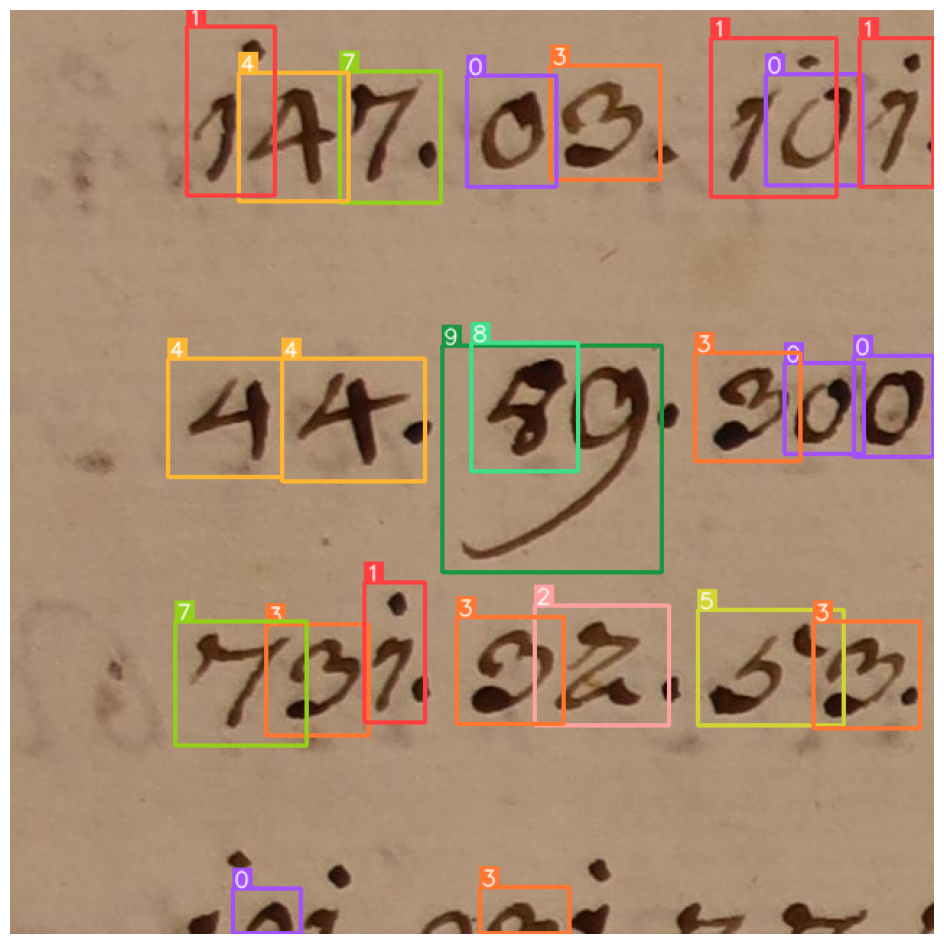

In [ ]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/digits_original_crops/test/images/IMG_1396_col320_row2240_jpg.rf.544b449487d06932a6292e1ef744ab20.jpg")
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/digits_original_crops/test/images/IMG_1396_col320_row2240_jpg.rf.544b449487d06932a6292e1ef744ab20.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)


0: 3200x3200 (no detections), 893.5ms
Speed: 74.1ms preprocess, 893.5ms inference, 1.7ms postprocess per image at shape (1, 3, 3200, 3200)


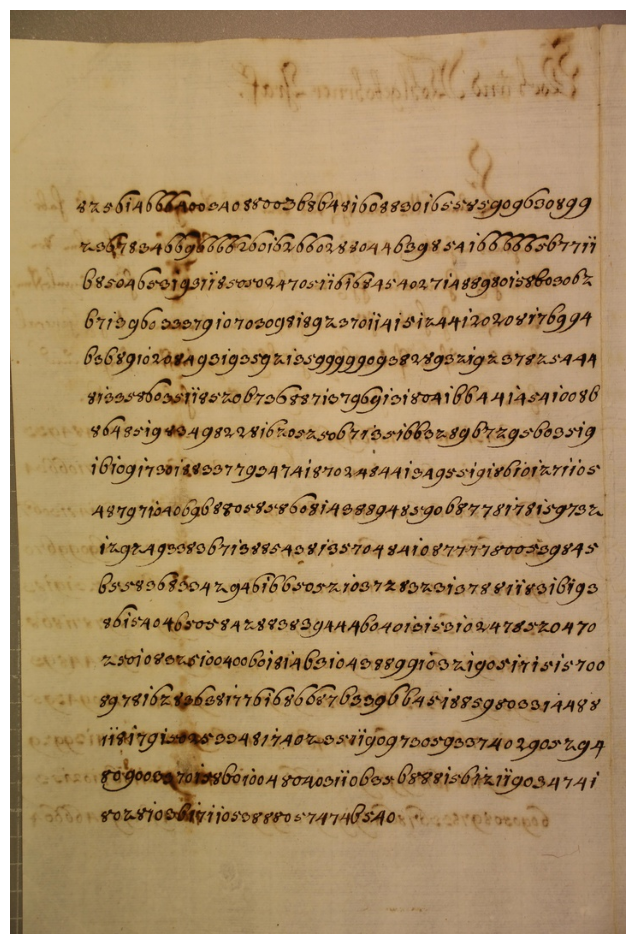

In [ ]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
        imgsz=3200
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)


0: 3200x3200 (no detections), 916.2ms
Speed: 83.8ms preprocess, 916.2ms inference, 0.7ms postprocess per image at shape (1, 3, 3200, 3200)


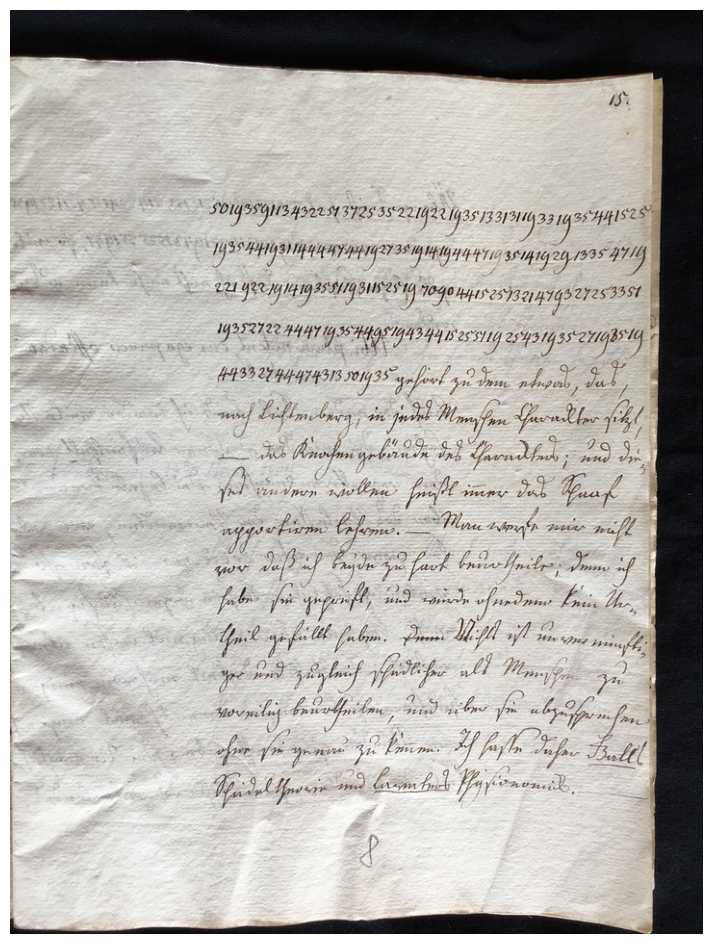

In [ ]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
        imgsz=3200
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)

## SAHI Digits:

In [ ]:
def digits_model_callback(x: np.ndarray) -> Detections:
    result = digits_model(x, verbose=False, conf=0.25)[0]
    return Detections.from_ultralytics(result)

In [ ]:
digits_sahi_model = InferenceSlicer(
    callback=digits_model_callback,
    slice_wh=(160, 160),
    overlap_ratio_wh=(0.3, 0.3)
)

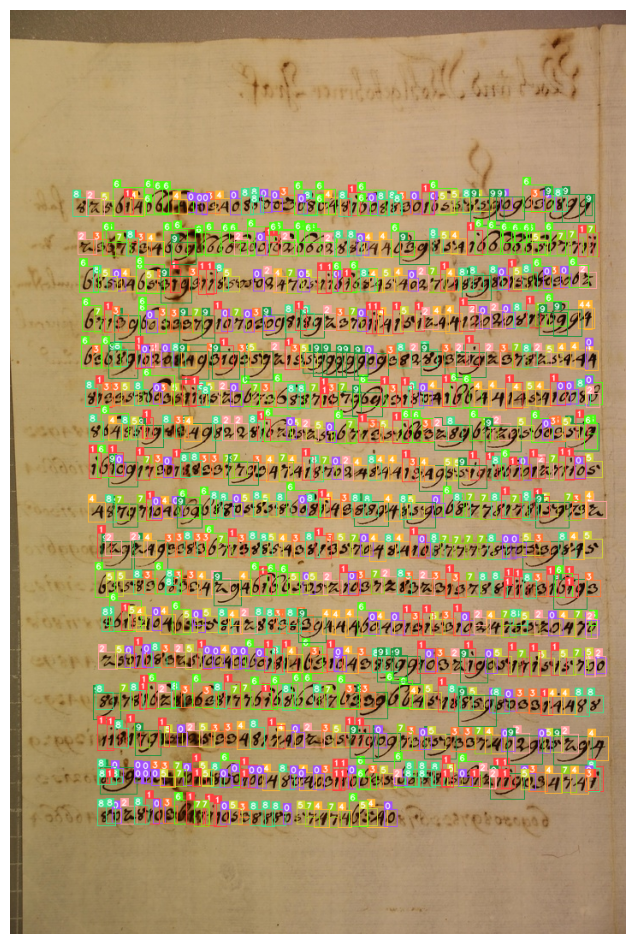

In [ ]:
digits_sahi_detections = digits_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
    detections=digits_sahi_detections
)
plot_image(digits_annotated_array)

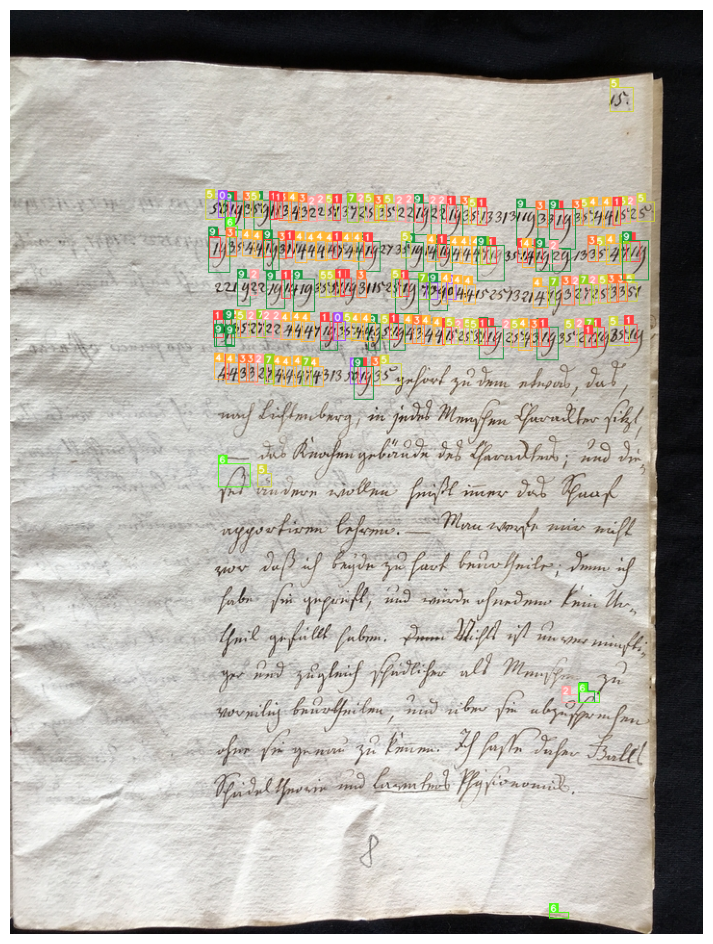

In [ ]:
digits_sahi_detections = digits_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
    detections=digits_sahi_detections
)
plot_image(digits_annotated_array)

## Glyphs:

In [ ]:
glyphs_model = RTDETR("/content/drive/MyDrive/DP/VEGA/weights/rt_detr_glyphs_best.pt")

In [ ]:
glyphs_model_test_metrics = glyphs_model.val(data="/content/glyphs_original_crops/data.yaml", split="test")

Ultralytics YOLOv8.1.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
rt-detr-l summary: 498 layers, 32316650 parameters, 0 gradients, 104.2 GFLOPs


val: Scanning /content/glyphs_original_crops/test/labels... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:00<00:00, 1666.90it/s]

val: New cache created: /content/glyphs_original_crops/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 102/102 [01:04<00:00,  1.58it/s]


                   all       1627       3656      0.846      0.959      0.955       0.94
                     N       1627         21      0.737          1      0.914      0.914
                     Q       1627         23          1       0.99      0.995      0.991
                     R       1627         19      0.812          1      0.954      0.943
                     W       1627         22       0.87      0.912      0.979      0.959
                 Z - -       1627         27      0.891          1      0.978      0.968
                 Z - I       1627         27      0.901      0.963      0.968      0.956
                     Z       1627         24      0.843      0.896      0.929      0.903
                 u0023       1627         19      0.764      0.853      0.857      0.768
                 u002a       1627         24      0.727          1      0.913      0.804
                 u003d       1627         25      0.852          1      0.987      0.977
                 u004


0: 640x640 1 u0023, 1 u002a, 1 u0043, 1 u0186, 1 u0223, 1 u03a5, 1 u03c0, 1 u0564, 1 u06ba, 1 u25a1, 91.2ms
Speed: 2.2ms preprocess, 91.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


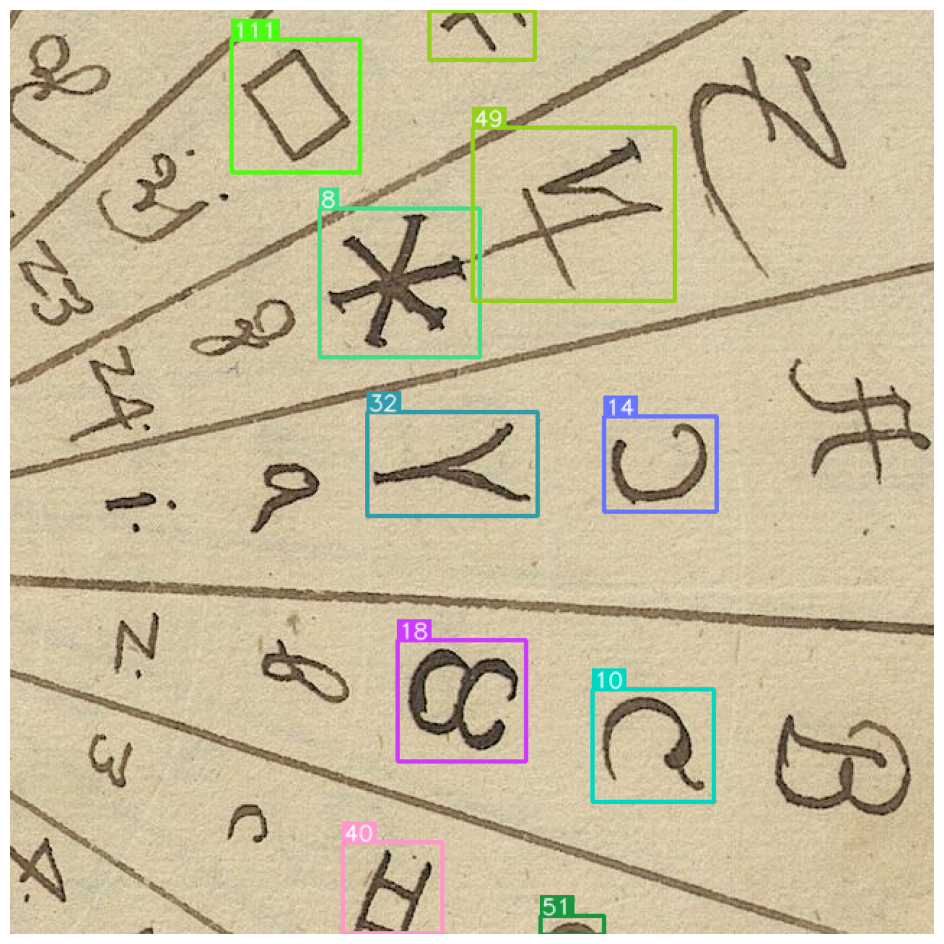

In [ ]:
glyphs_detections = Detections.from_ultralytics(
    glyphs_model.predict(
        source=cv2.imread("/content/glyphs_original_crops/test/images/hhstaw_130_i_1576_0089_jpg_col1600_row1600_jpg.rf.40fc3cd09c8d0440a4cea59cad864d2f.jpg")
    )[0]
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/glyphs_original_crops/test/images/hhstaw_130_i_1576_0089_jpg_col1600_row1600_jpg.rf.40fc3cd09c8d0440a4cea59cad864d2f.jpg"),
    detections=glyphs_detections
)
plot_image(glyphs_annotated_array)


0: 3200x3200 (no detections), 956.9ms
Speed: 93.4ms preprocess, 956.9ms inference, 0.9ms postprocess per image at shape (1, 3, 3200, 3200)


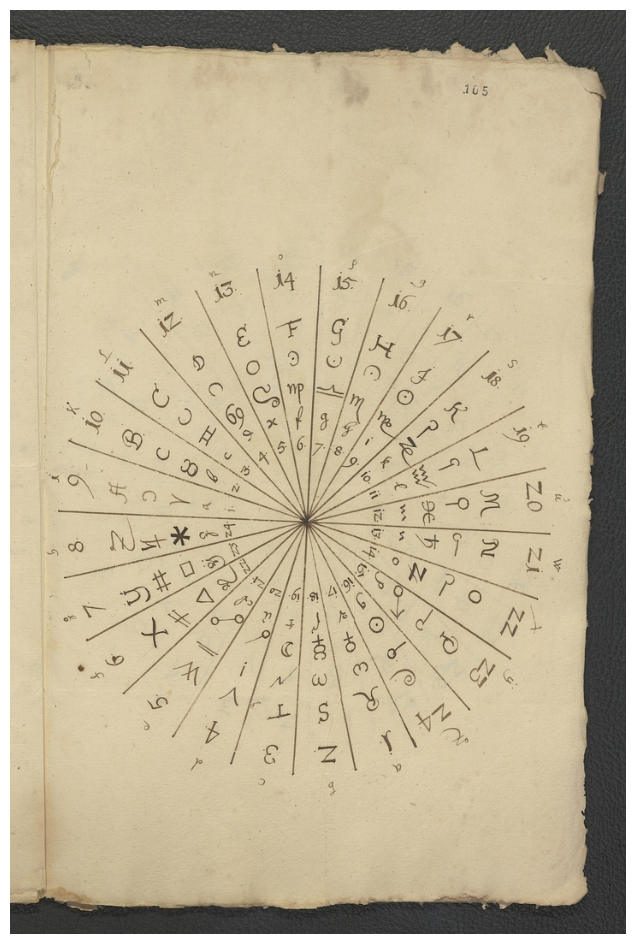

In [ ]:
glyphs_detections = Detections.from_ultralytics(
    glyphs_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
        imgsz=3200
    )[0]
)

glpyhs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
    detections=glyphs_detections
)
plot_image(glpyhs_annotated_array)

## SAHI Glyphs:

In [ ]:
def glyphs_model_callback(x: np.ndarray) -> Detections:
    result = glyphs_model(x, verbose=False, conf=0.25)[0]
    return Detections.from_ultralytics(result)

In [ ]:
glyphs_sahi_model = InferenceSlicer(
    callback=glyphs_model_callback,
    slice_wh=(160, 160),
    overlap_ratio_wh=(0.3, 0.3)
)

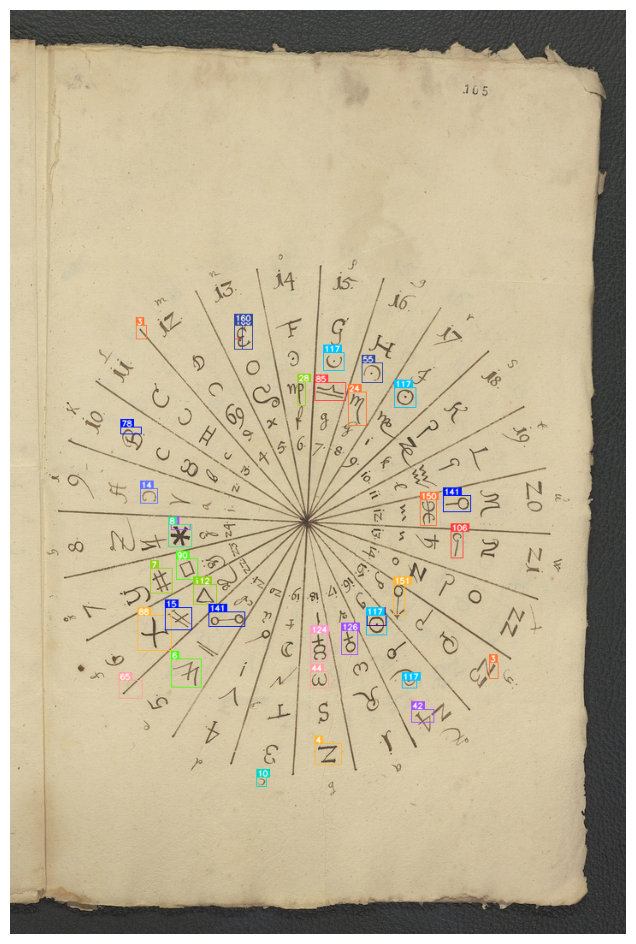

In [ ]:
glyphs_sahi_detections = glyphs_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
    detections=glyphs_sahi_detections
)
plot_image(glyphs_annotated_array)